In [2]:
import cv2
import numpy
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from os import listdir
from os.path import isfile, join
from pathlib import Path
import cv2
import numpy as np
import operator
import matplotlib.pyplot as plt

In [2]:
path = Path("cathedral")
result_path = path/"result.png"
img_paths = [p for p in path.iterdir() if str(p) !=str(result_path)]
img_paths = sorted(img_paths)
result = cv2.imread(str(result_path), cv2.IMREAD_COLOR)
imgs = np.array([cv2.imread(str(p), cv2.IMREAD_COLOR) for p in img_paths])
imgs.shape

(5, 500, 752, 3)

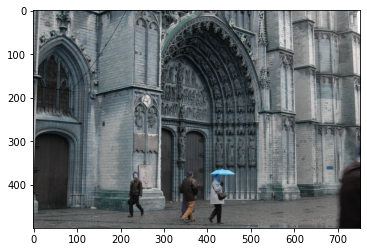

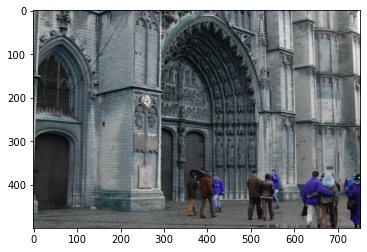

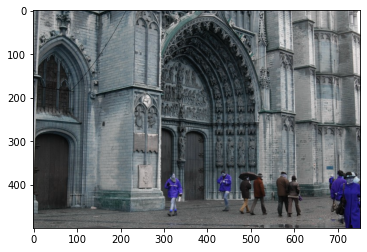

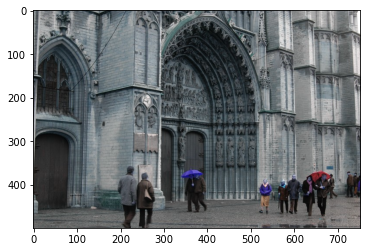

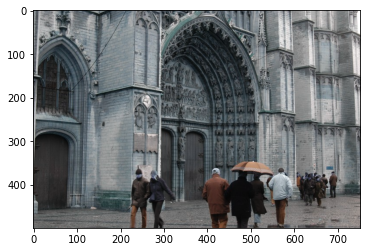

In [3]:
for img in imgs:
    plt.imshow(img)
    plt.show()

## Mean filter

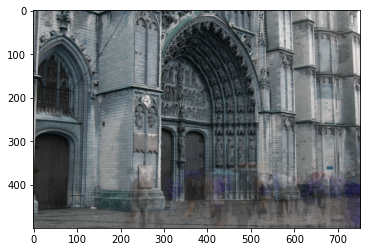

In [4]:
plt.imshow(np.mean(imgs, axis=0).astype(np.uint16))
plt.show()

## Median filter

(500, 752, 3)


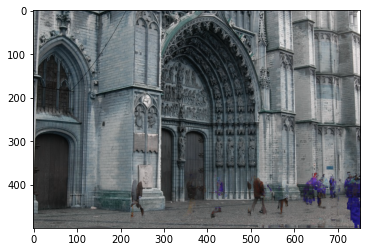

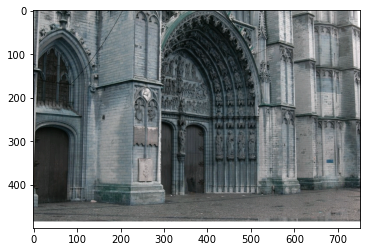

In [5]:
our_result = np.median(imgs, axis=0).astype(np.uint16)
print(our_result.shape)
plt.imshow(our_result)
plt.show()
plt.imshow(result)

Closest to mean

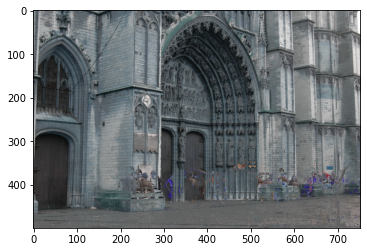

In [6]:
mean = np.mean(imgs,axis=(0,1,2))
distances = np.sum((imgs - mean)**2, axis=3)
indices = np.argmin(distances, axis = 0)
indices = np.stack((indices,)*3, axis=-1)
our_result = np.take_along_axis(imgs, indices[np.newaxis], axis=0)[0]
plt.imshow(our_result)
plt.show()

/home/kacper/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


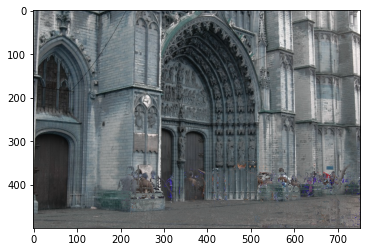

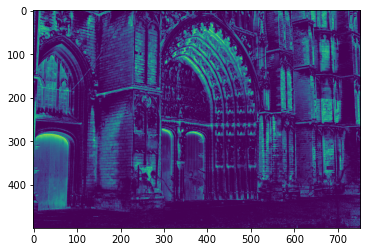

In [7]:
mean = np.mean(imgs,axis=(0,1,2))
m = 2
distance_candidates = (np.sum((imgs - color)**m, axis=3) for color in [mean, np.array([255,255,255]), np.array([81,96,93])])
distances = np.min(np.stack(distance_candidates, axis = -1), axis=-1)
indices = np.argmin(distances, axis = 0)
indices = np.stack((indices,)*3, axis=-1)
our_result = np.take_along_axis(imgs, indices[np.newaxis], axis=0)[0]
plt.imshow(our_result)
plt.show()
plt.imshow(np.min(distances, axis=0))
plt.show()

## Edge detection

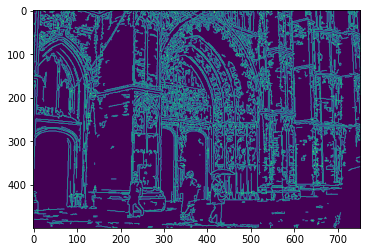

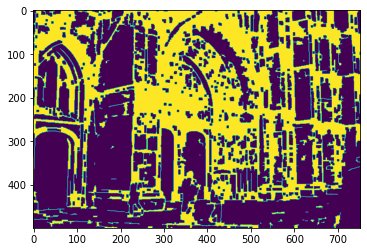

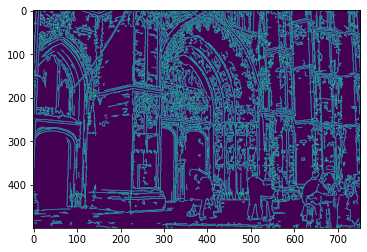

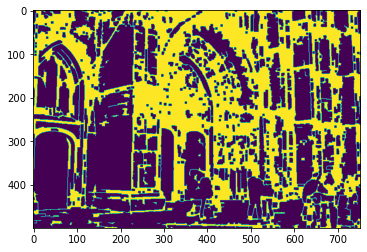

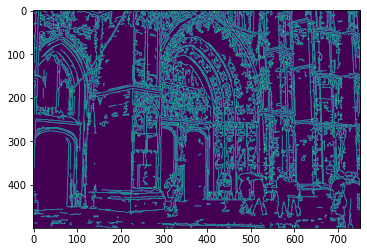

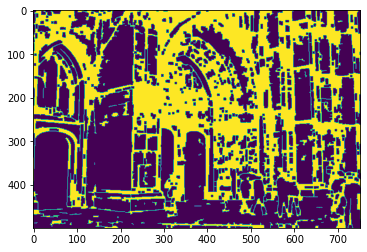

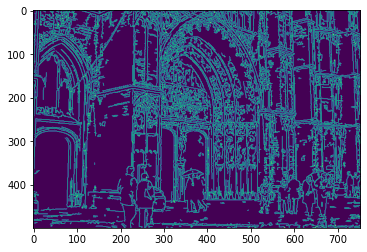

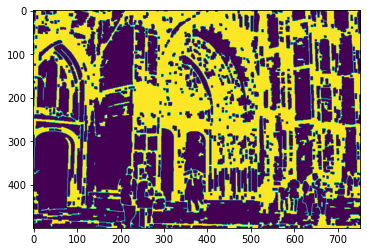

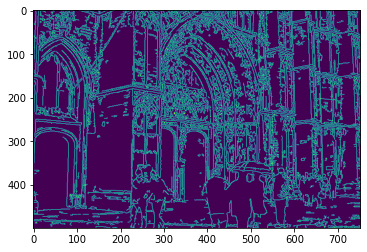

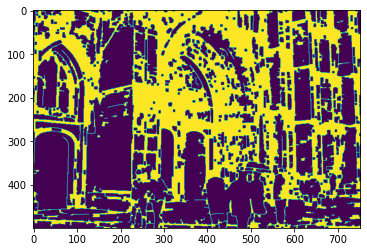

In [8]:
for img in imgs:
    edges = cv2.Canny(img,100,200)
    plt.imshow(edges)
    plt.show()
    struct = np.ones([5, 5], np.uint8)
    cls = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, struct)
#     cls = cv2.morphologyEx(cls, cv2.MORPH_OPEN, struct)
    plt.imshow(cls)
    plt.show()
    

[255]


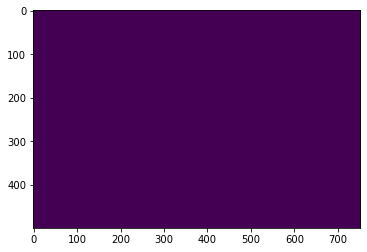

[255]


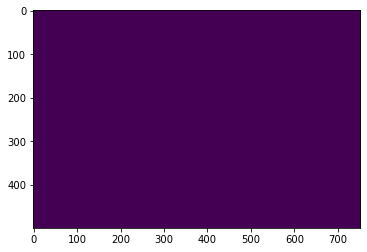

[  0 255]


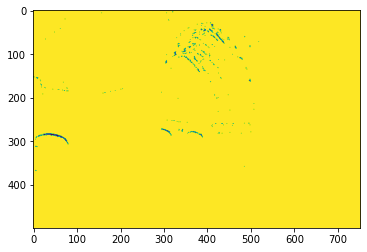

[  0 255]


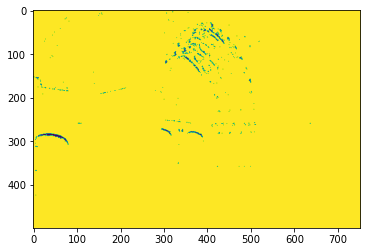

[  0 127 255]


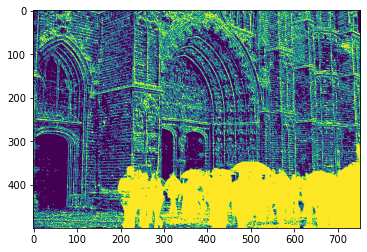

In [9]:
backSub = cv2.createBackgroundSubtractorKNN()
for img in imgs:
    fgMask = backSub.apply(img)
    print(np.unique(fgMask))
    plt.imshow(fgMask)
    plt.show()

## Removing people

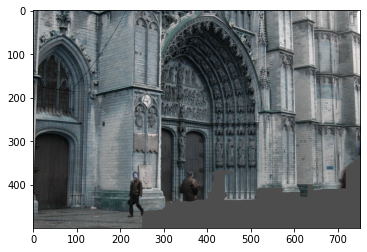

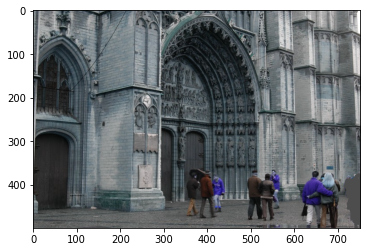

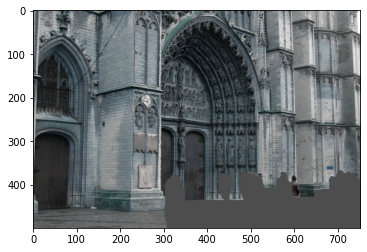

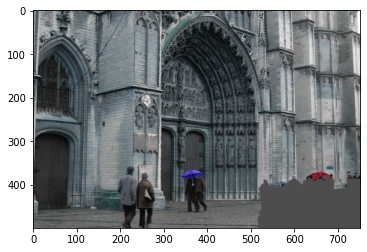

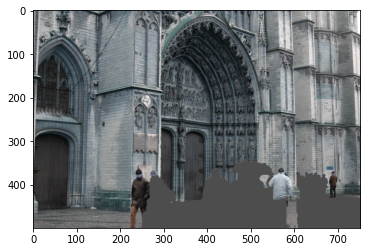

In [4]:
def delete_people(img,img_bbox, border=250):
    def get_points(img,filter2d):
        cadidates = (cv2.filter2D(img, -1,filter2d) == 3).astype(np.uint8)
        corners = np.where(cadidates == 1)
        return [(x,y) for x,y in zip(corners[0], corners[1])]

    res = np.all((img_bbox == np.array([0,255,0])),axis=2).astype(np.uint8)
    left_up = np.array([
        [1,1],
        [1,-1]
    ])

    top_left_corners = get_points(res, left_up)

    right_bottom = np.array([
        [-1,1],
        [1,1]
    ])

    bottom_right_corners = get_points(res, right_bottom)
    from scipy.spatial.distance import cdist
    from scipy.optimize import linear_sum_assignment

    distances = cdist(top_left_corners,bottom_right_corners)

    _, assigment = linear_sum_assignment(distances)
    boxes = [(top_left_corners[i][0],
              top_left_corners[i][1],
             bottom_right_corners[assigment[i]][0],
             bottom_right_corners[assigment[i]][1]) for i in range(len(assigment))]

    final_mask = np.zeros(img.shape[:2], dtype=np.uint8)

    for box in boxes:
        new_x1 = max(box[0]-border,0)
        new_y1 = max(box[1]-border,0)
        new_x2 = min(box[2]+border, img.shape[0])
        new_y2 = min(box[3]+border, img.shape[1])

        cur_img = img[new_x1:new_x2,new_y1:new_y2]
        rect = (box[0]-new_x1,box[1]-new_y1,box[2]-new_x1,box[3]-new_y1)
        mask = np.zeros(res.shape[:2], dtype="uint8")
        fgModel = np.zeros((1, 65), dtype="float")
        bgModel = np.zeros((1, 65), dtype="float")
        (mask, bgModel, fgModel) = cv2.grabCut(cur_img, mask, rect, bgModel,
            fgModel, 3, mode=cv2.GC_INIT_WITH_RECT)

        outputMask = np.where((mask == cv2.GC_BGD) | (mask == cv2.GC_PR_BGD),
            0,1)
        outputMask = (outputMask * 255).astype("uint8")
        final_mask[new_x1:new_x2,new_y1:new_y2] = outputMask

    output = cv2.bitwise_and(img, img, mask=255-final_mask)
#     output + (255-mask)*imageThatIsWholeGreen
    output[255-final_mask==0] = np.array([77,77,77])
#     print(((255-final_mask) ==0).any())
    plt.imshow(output)
    plt.show()
    return output, final_mask
    
images  = []
for i in range(1,6):
    test = cv2.imread(f"boxes/d00{i}-boxes.png", cv2.IMREAD_COLOR)
    img = cv2.imread(f"cathedral/d00{i}.jpg", cv2.IMREAD_COLOR)
    output = delete_people(img,test)
    images.append(output[0])
# print(images)
#     break

In [6]:
def pick_right_pixel(pixels, param1=0.15, param2=0.15):
    a_dict = {}
    a_dict[tuple(pixels[0])] = 1
    for pixel in pixels[1:]:
        should_continue = False
        for key, value in a_dict.items():
            truths = [r * (1 - param1) <= rp <= r * (1 + param2) for r, rp in zip(key, pixel)]
            if all(truths):
                a_dict[key] += 1
                # print("XD")
                should_continue = True
                break
        if should_continue:
            continue
        else:
            a_dict[tuple(pixel)] = 1


#     avoid = [[32, 26, 149],
#              [121, 117, 215],
#              [20, 10, 150],
#              [60, 71, 206],
#              [68, 36, 38],
#              [52, 41, 40],
#              [47, 37, 39],
#              [88, 68, 65],
#              [74, 42, 45],
#              [47, 46, 63],
#              [55,55,73],
#              [69,69,69]]

#     to_remove_keys = []
#     for to_avoid in avoid:
#         for key, value in a_dict.items():

#             difference_squared = np.sum((np.array(key) - np.array(to_avoid)) ** 2)
#             # print(difference_squared, np.array(key) - np.array(to_avoid))
#             if difference_squared < 1500:
#                 # print("taka sytuacja")
#                 to_remove_keys.append(key)
# #     if len(to_remove_keys) != 0:
# #         print(to_remove_keys)
#     for key in set(to_remove_keys):
#         del a_dict[key]
    
    to_remove_keys = [(77,77,77)]
    for key in set(to_remove_keys):
        try:
            del a_dict[key]
#             print("tutaj")
        except KeyError:
            continue

    check_point = [True if value == 1 else False for value in a_dict.values()]
    if all(check_point):
        # print(a_dict)
        # print(list(np.mean(pixels, axis=0).astype(np.int32)))
        # print()
#         if len(a_dict.keys()) < 5:
#             print(a_dict)
#             print(np.array(pixels))
#             print()

        return list(np.mean(pixels, axis=0).astype(np.int32))
    #     raise "Error"
    best_pixel = max(a_dict.items(), key=operator.itemgetter(1))[0]
    # print(best_pixel)

    return best_pixel


def iterate(images, param1, param2):
    print(images[0].shape)
    images = [image.reshape(-1, 3) for image in images]
    print(images[0].shape)
    final_image = []
    for dd in range(0, images[0].shape[0]):
        pixels = [list(images[x][dd]) for x in range(0, len(images))]
        best_pixel = pick_right_pixel(pixels, param1, param2)
        final_image.append(list(best_pixel))

    final_image = np.array(final_image)
    final_image = final_image.reshape((500, 752, 3))
    # print(final_image)
    plt.title(str(param1) + " " + str(param2))
    plt.imshow(final_image)
    plt.show()
    return final_image
    
# # print(images[0])
# iterate(images, param1=0.15, param2=0.07)
# iterate(images, param1=0.07, param2=0.15)
# iterate(images, param1=0.15, param2=0.15)
# iterate(images, param1=0.05, param2=0.05)

(500, 752, 3)
(376000, 3)


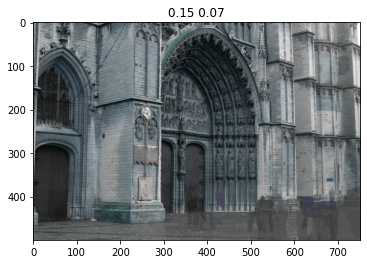

(500, 752, 3)
(376000, 3)


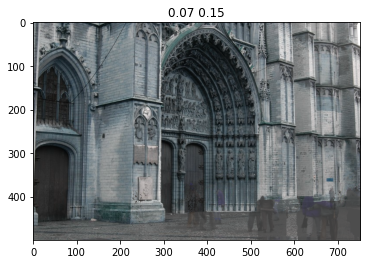

(500, 752, 3)
(376000, 3)


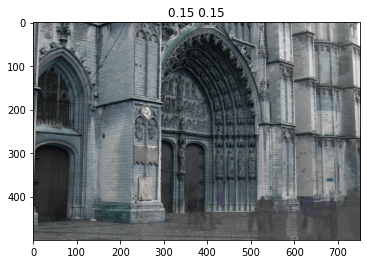

(500, 752, 3)
(376000, 3)


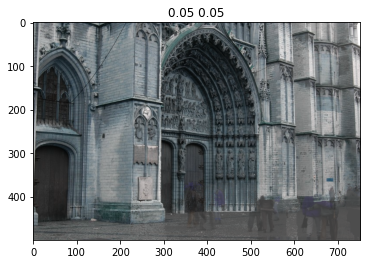

In [57]:
iterate(images, param1=0.15, param2=0.07)
iterate(images, param1=0.07, param2=0.15)
iterate(images, param1=0.15, param2=0.15)
iterate(images, param1=0.05, param2=0.05)

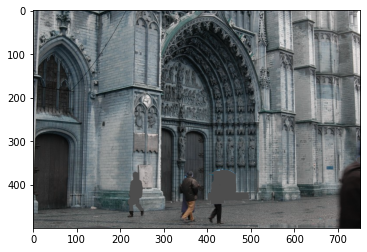

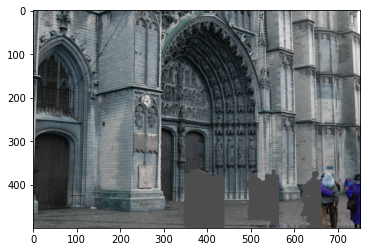

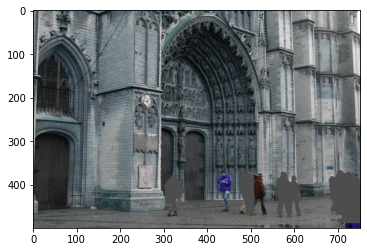

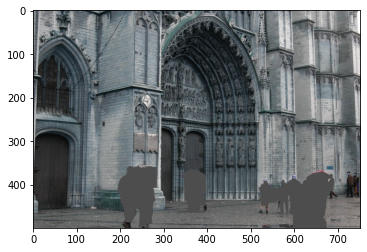

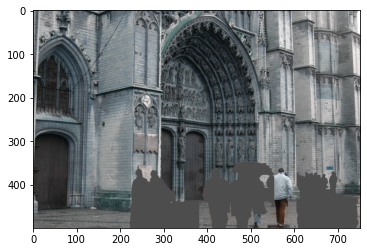

(500, 752, 3)
(376000, 3)


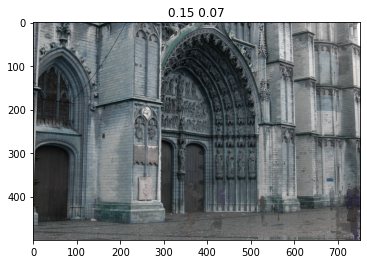

1
[array([[[135, 142, 151],
        [134, 141, 150],
        [138, 146, 153],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[140, 147, 156],
        [134, 141, 150],
        [136, 144, 151],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [255, 255, 255]],

       [[144, 151, 160],
        [135, 142, 151],
        [135, 143, 150],
        ...,
        [254, 254, 254],
        [252, 252, 252],
        [255, 255, 255]],

       ...,

       [[ 92,  97,  96],
        [ 92,  97,  96],
        [ 92,  94,  94],
        ...,
        [ 62,  58,  75],
        [ 66,  63,  79],
        [127, 124, 126]],

       [[101, 106, 105],
        [101, 106, 105],
        [100, 102, 102],
        ...,
        [ 57,  53,  69],
        [115, 110, 112],
        [ 81,  77,  93]],

       [[ 91,  96,  95],
        [ 96, 101, 100],
        [102, 104, 104],
        ...,
        [145, 140, 141],
        [139, 134, 136],
        [144, 139, 14

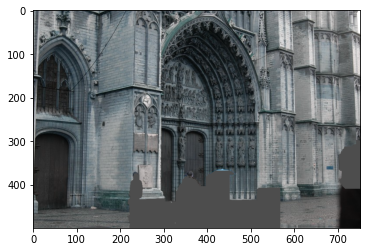

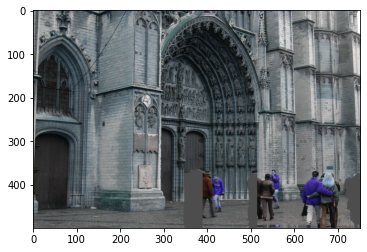

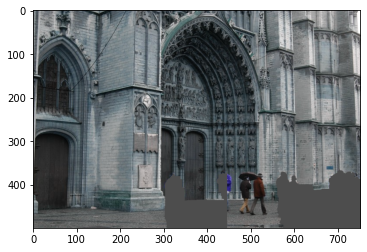

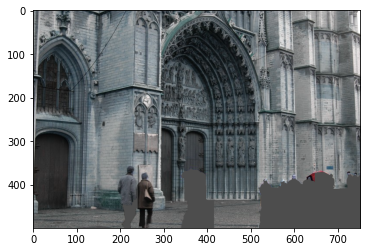

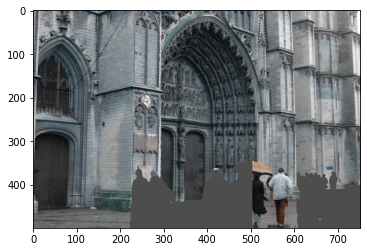

(500, 752, 3)
(376000, 3)


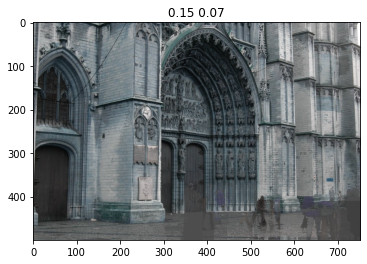

2
[array([[[135, 142, 151],
        [134, 141, 150],
        [138, 146, 153],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[140, 147, 156],
        [134, 141, 150],
        [136, 144, 151],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [255, 255, 255]],

       [[144, 151, 160],
        [135, 142, 151],
        [135, 143, 150],
        ...,
        [254, 254, 254],
        [252, 252, 252],
        [255, 255, 255]],

       ...,

       [[ 92,  97,  96],
        [ 92,  97,  96],
        [ 92,  94,  94],
        ...,
        [ 62,  58,  75],
        [ 66,  63,  79],
        [127, 124, 126]],

       [[101, 106, 105],
        [101, 106, 105],
        [100, 102, 102],
        ...,
        [ 57,  53,  69],
        [115, 110, 112],
        [ 81,  77,  93]],

       [[ 91,  96,  95],
        [ 96, 101, 100],
        [102, 104, 104],
        ...,
        [145, 140, 141],
        [139, 134, 136],
        [144, 139, 14

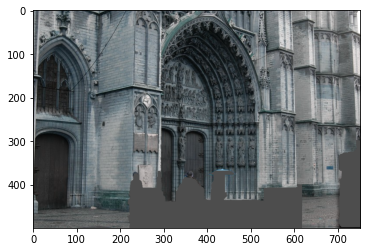

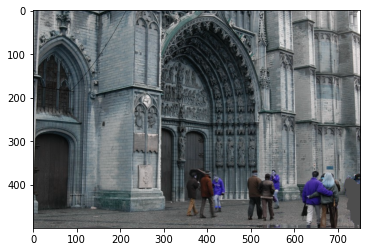

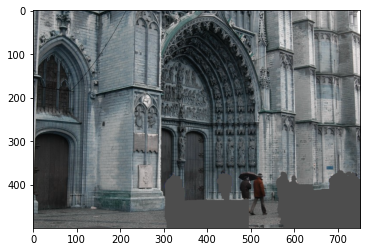

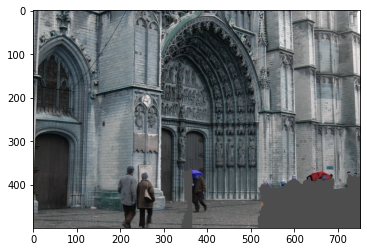

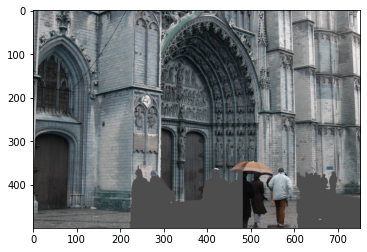

(500, 752, 3)
(376000, 3)


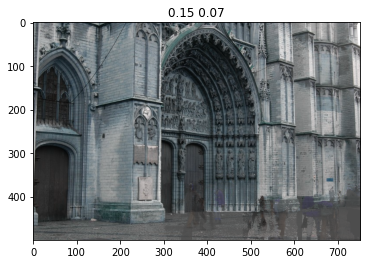

3
[array([[[135, 142, 151],
        [134, 141, 150],
        [138, 146, 153],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[140, 147, 156],
        [134, 141, 150],
        [136, 144, 151],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [255, 255, 255]],

       [[144, 151, 160],
        [135, 142, 151],
        [135, 143, 150],
        ...,
        [254, 254, 254],
        [252, 252, 252],
        [255, 255, 255]],

       ...,

       [[ 92,  97,  96],
        [ 92,  97,  96],
        [ 92,  94,  94],
        ...,
        [ 62,  58,  75],
        [ 66,  63,  79],
        [127, 124, 126]],

       [[101, 106, 105],
        [101, 106, 105],
        [100, 102, 102],
        ...,
        [ 57,  53,  69],
        [115, 110, 112],
        [ 81,  77,  93]],

       [[ 91,  96,  95],
        [ 96, 101, 100],
        [102, 104, 104],
        ...,
        [145, 140, 141],
        [139, 134, 136],
        [144, 139, 14

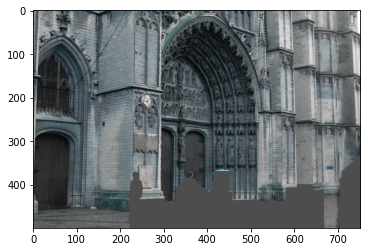

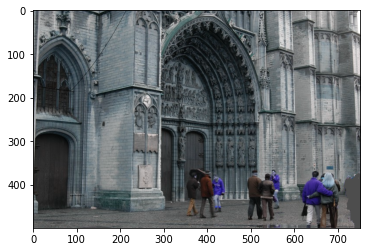

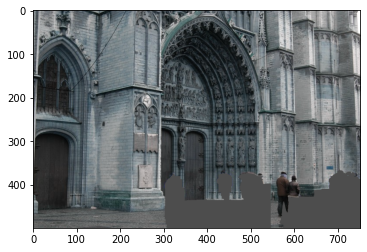

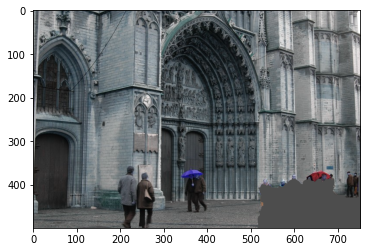

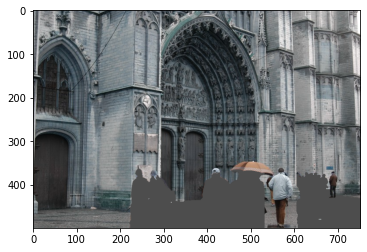

(500, 752, 3)
(376000, 3)


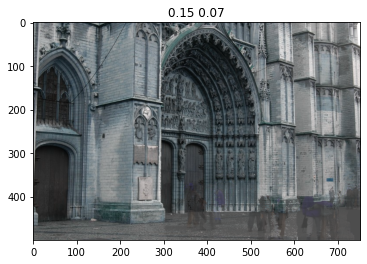

4
[array([[[135, 142, 151],
        [134, 141, 150],
        [138, 146, 153],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[140, 147, 156],
        [134, 141, 150],
        [136, 144, 151],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [255, 255, 255]],

       [[144, 151, 160],
        [135, 142, 151],
        [135, 143, 150],
        ...,
        [254, 254, 254],
        [252, 252, 252],
        [255, 255, 255]],

       ...,

       [[ 92,  97,  96],
        [ 92,  97,  96],
        [ 92,  94,  94],
        ...,
        [ 62,  58,  75],
        [ 66,  63,  79],
        [127, 124, 126]],

       [[101, 106, 105],
        [101, 106, 105],
        [100, 102, 102],
        ...,
        [ 57,  53,  69],
        [115, 110, 112],
        [ 81,  77,  93]],

       [[ 91,  96,  95],
        [ 96, 101, 100],
        [102, 104, 104],
        ...,
        [145, 140, 141],
        [139, 134, 136],
        [144, 139, 14

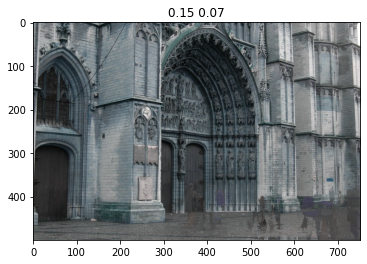

array([[[135, 142, 151],
        [134, 141, 150],
        [138, 146, 153],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[140, 147, 156],
        [134, 141, 150],
        [136, 144, 151],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [255, 255, 255]],

       [[144, 151, 160],
        [135, 142, 151],
        [135, 143, 150],
        ...,
        [254, 254, 254],
        [252, 252, 252],
        [255, 255, 255]],

       ...,

       [[ 92,  97,  96],
        [ 92,  97,  96],
        [ 92,  94,  94],
        ...,
        [ 69,  68,  73],
        [ 70,  70,  74],
        [ 86,  85,  85]],

       [[101, 106, 105],
        [101, 106, 105],
        [100, 102, 102],
        ...,
        [ 63,  63,  63],
        [ 63,  63,  63],
        [ 63,  63,  63]],

       [[ 91,  96,  95],
        [ 96, 101, 100],
        [102, 104, 104],
        ...,
        [ 63,  63,  63],
        [ 63,  63,  63],
        [ 63,  63,  63]]

In [10]:
final_images = []
for x in [50, 100,150, 200]:
    images  = []
    for i in range(1,6):
        test = cv2.imread(f"boxes/d00{i}-boxes.png", cv2.IMREAD_COLOR)
        img = cv2.imread(f"cathedral/d00{i}.jpg", cv2.IMREAD_COLOR)
        output = delete_people(img,test,border=x)
        images.append(output[0])
    final_image = iterate(images, param1=0.15, param2=0.07)
    final_images.append(final_image)
    print(len(final_images))
    print(final_images)
# print("Koniec")
iterate(final_images, param1=0.15, param2=0.07)